In [ ]:
# MIT License
#
#@title Copyright (c) 2026 CCAI Community Authors { display-mode: "form" }
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

# CCAI Tutorial on Flood Monitoring — Part II: Water
Authors:
*   Casper Fibaek, [ESA Φ-lab](https://philab.esa.int/), Casper.Fibaek@esa.int
*   Andreas Luyts, [ESA Φ-lab](https://philab.esa.int/), Andreas.Luyts@ext.esa.int
*   Nirdesh Kumar Sharma, [EarthSense Labs](https://earthsenselabs.com/), nirdesh@earthsenselabs.com


**Prerequisites**:
1.   Basic understanding of Deep Learning and Remote Sensing.
2.   Familiarity with Python and geospatial data processing.
3.   Part I of this tutorial (building density from Sentinel-2), which introduces the datasets and the model architecture re-used here.

**Software requirements**:

We are going to use Google Colab. Some cloud storage is necessary to load the imagery.

**Goals**

* The purpose of this tutorial is to give an introduction to the use of Convolutional Neural Networks and satellite images for climate science and disaster risk reduction.
* The data will not be polished RGB data, which is often what is used in AI tutorials, but real satellite data that comes with more bands and modalities. The tutorial introduces these datasets and showcases how they can be used to map structures and surface water in a simple way — and how such maps feed into humanitarian and disaster-response decision-making.


# Table of Contents


*   [Overview](#overview)
*   [Learning Objectives](#learning-objectives)
*   [Climate Impact](#climate-impact)
*   [Target Audience](#target-audience)
*   [Background & Prerequisites](#background-and-prereqs)
*   [Software Requirements](#software-requirements)
*   [Data Description](#data-description)
*   [Methodology](#methodology)
*   [Results & Discussion](#results-and-discussion)
*   [The Carbon Cost of This Notebook](#carbon-cost)
*   [From Predictions to Decisions](#predictions-to-decisions)
*   [Limitations & Responsible Use](#limitations-responsible-use)
*   [Doing Scalable and Publishable Work](#scalable-publishable)
*   [References](#references)


<a name="overview"></a>
# Overview

This notebook is Part II of a two-part tutorial on flood monitoring. The two parts fit together like this:

* **Part I — Exposure**: a convolutional neural network was trained with labelled data to predict **building density** from Sentinel-2 optical (multispectral) imagery. This tells us *where people and structures are* — what is exposed if a flood occurs.
* **Part II (this notebook) — Hazard**: we train a model to map **surface water** from Sentinel-1 radar (SAR) imagery. This tells us *where the water is* — the extent of the hazard itself.

Neither layer is very useful for flood response on its own: a water map without knowing what is underneath it, or a building map without knowing what is flooded, answers only half the question. Combined — ideally together with elevation and population data — they let us estimate which communities are exposed to flooding, which is the basis for risk assessment and response planning. We return to this in [From Predictions to Decisions](#predictions-to-decisions).

Why radar? Flooding events usually come with heavy cloud cover, so Sentinel-2 optical data cannot be used — clouds block the view. SAR is not limited by this and can monitor surface water in any weather, day or night. The catch is that SAR imagery is hard to label by hand. So we first map water in a cloud-free Sentinel-2 scene using a spectral index (NDWI), and then use that index as a **proxy label** to train a convolutional neural network that predicts water from Sentinel-1 alone.


<a name="learning-objectives"></a>
# Learning Objectives

By the end of this notebook you should be able to:

1. Explain why SAR (Sentinel-1) is the sensor of choice for mapping floods, and what its trade-offs are compared to optical imagery.
2. Compute a spectral water index (NDWI) from Sentinel-2 and use it as a *proxy label* to train a model without hand-digitised labels — and articulate what can go wrong with proxy-label supervision.
3. Train and validate a small convolutional network that predicts surface water from SAR, and read its loss curves for signs of over- or underfitting.
4. Evaluate a water map with classification metrics (IoU, F1, precision, recall) and explain why these matter more than MSE for flood mapping.
5. Describe how AI-generated water and building-density maps feed into disaster-risk-reduction workflows (early warning, response planning, resource allocation) and who the stakeholders are.
6. Measure the energy use and CO₂ emissions of your own training and inference runs with CodeCarbon, and report them alongside accuracy.
7. Identify the key limitations of such maps — uncertainty, data gaps, spatial resolution, representation of vulnerable communities — and explain why model outputs must be treated as decision *support*, not decision *making*.


<a name="climate-impact"></a>
# Climate Impact

Floods are the most frequent type of natural disaster, and both their frequency and severity are increasing as the climate warms: a warmer atmosphere holds more moisture, which intensifies extreme rainfall, while sea-level rise raises the baseline for coastal flooding. The people most affected are often those least able to cope — low-income and informal communities in low-lying areas.

The study area of this tutorial, **Alexandria and the Nile delta**, is one of the world's flood hotspots. The delta is densely populated, much of it lies only a few metres above sea level, and land subsidence combines with sea-level rise to steadily increase coastal flood risk. The IPCC identifies the Nile delta among the deltas most vulnerable to climate change.

Satellite-based flood mapping matters here for a practical reason: during a flood the sky is usually overcast, roads may be impassable, and ground assessments are slow and dangerous. Radar satellites see through clouds and revisit every few days, so an accurate SAR-based water map is often the *first* objective picture responders get of a flood's extent. Machine learning helps turn raw SAR backscatter into such maps quickly and at scale.


<a name="target-audience"></a>
# Target Audience

This tutorial is aimed at:

* Data scientists and ML practitioners who want to apply their skills to Earth observation and climate-related problems.
* Remote-sensing and GIS practitioners who want a hands-on introduction to deep learning on satellite data.
* Students, researchers, and practitioners in disaster risk reduction and humanitarian response who want to understand what AI-based flood maps can and cannot tell them.

No prior experience with SAR data is assumed. Basic familiarity with Python, NumPy, and the concepts of convolutional neural networks (covered in Part I) is expected.


<a name="background-and-prereqs"></a>
# Background & Prerequisites

All necessary background is given in **Part I** of this tutorial, which covers the Sentinel-1 and Sentinel-2 missions and their data, patch-based training of convolutional networks on satellite imagery, and predicting building density as an exposure layer. If you have not completed Part I, we recommend doing so first — this notebook re-uses the same model architecture, data region, and training approach, and its outputs are meant to be combined with Part I's building-density predictions.


<a name="software-requirements"></a>
# Software Requirements

On Colab, make sure to **enable a GPU runtime** (this should happen automatically; otherwise go to 'Runtime' in the upper taskbar and select 'Change runtime type'). With a GPU the models will train much faster and there will be more RAM available for processing. The notebook also runs on a CPU-only runtime, just slower.

**The tools.**

* PyTorch
* NumPy
* Matplotlib
* Buteo
* CodeCarbon

Google Colab comes preinstalled with PyTorch, NumPy, and Matplotlib, so we only need to install buteo and codecarbon.

**Buteo** is a toolbox designed to simplify the process of working with geospatial data in machine learning. It includes tools for reading, writing, and processing geospatial data, as well as tools for creating labels from vector data and generating patches from geospatial data. Buteo makes it easy to ingest data, create training data, and perform inference on geospatial data.<br>
[Documentation](https://casperfibaek.github.io/buteo/buteo.html)

**CodeCarbon** is a lightweight library that estimates the electricity a piece of code consumes and converts it into CO₂-equivalent emissions. It samples the power draw of the CPU, GPU, and RAM while your code runs, turns that into kilowatt-hours, and multiplies by the carbon intensity of the electricity grid your machine is plugged into. We use it to put a number on what this notebook itself costs — a habit worth keeping in any climate-related ML project.<br>
[Documentation](https://docs.codecarbon.io/)


In [1]:
# Install buteo
!pip install buteo==0.9.15 -q


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.5/169.5 kB 9.3 MB/s eta 0:00:00


In [2]:
# Install CodeCarbon, to measure the energy and emissions of this notebook.
!pip install codecarbon==3.2.9 -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 388.9/388.9 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.6/155.6 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 112.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 115.5 MB/s eta 0:00:00


In [3]:
import buteo as beo
import numpy as np
import torch
import os

In [4]:
#@title Utility functions
# Let's see what the data looks like! These functions are just for printing
# in Colab. You can safely ignore them.
import matplotlib
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import pyplot as plt
from collections.abc import Iterable

# Reset Matplotlib parameters to their default values
matplotlib.rcdefaults()

# Let's set some default pyplot parameters to make our plots look pretty.
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (16, 12)
plt.rcParams['figure.subplot.wspace'] = 0.05
plt.rcParams['image.interpolation'] = 'bilinear'


# Custom function for creating subplots with a specified face color
def custom_subplots(*args, facecolor="#FFFFFFFF", size=None, **kwargs):
    fig, axes = plt.subplots(*args, **kwargs)

    if size is not None:
        fig.set_size_inches(size[0], size[1])

    # Make sure axes is a list of axes objects
    if not isinstance(axes, Iterable) or isinstance(axes, np.ndarray) and axes.ndim == 0:
        axes = [axes]

    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])

        for spine in ax.spines.values():
            spine.set_edgecolor('black')
            spine.set_linewidth(1)

    # Reduce the distance between the plotted images in the width
    plt.subplots_adjust(wspace=0.05)

    # Change the background color of the whole plot to grey
    fig.set_facecolor(facecolor)  # RGBA tuple for grey, 100% transparent if supported

    axes = axes[0] if len(axes) == 1 else axes

    return fig, axes


def clip_to_quantiles(arr, q_min=0.02, q_max=0.98):
    return np.clip(arr,
        np.nanquantile(arr, q_min),
        np.nanquantile(arr, q_max),
    )


def compute_ndwi(green, nir):
    """NDWI = (green - nir) / (green + nir), guarded against division by zero.

    The result is clipped to [0, 1]: negative NDWI values (soil, vegetation)
    are not interesting for water mapping, so the target becomes
    '0 = no water, towards 1 = more water'.
    """
    top = green - nir
    bot = green + nir
    ndwi = np.zeros_like(green, dtype=np.float32)
    np.divide(top, bot, out=ndwi, where=bot != 0)
    np.clip(ndwi, 0.0, 1.0, out=ndwi)

    return ndwi


def render_s2_as_rgb(arr):
    # If there are nodata values, let's cast them to zero.
    if np.ma.isMaskedArray(arr):
        arr = np.ma.getdata(arr.filled(0))

    # Select only blue, green, and red.
    # Copy (as float32) so we don't modify the caller's array in place.
    rgb_slice = arr[:, :, 0:3].astype(np.float32, copy=True)

    # Clip the data to the quantiles, so the RGB render is not stretched to outliers,
    # which produces dark images.
    for c in [0, 1, 2]:
        rgb_slice[:, :, c] = clip_to_quantiles(rgb_slice[:, :, c])

    # We normalise each layer by dividing with the maximum value in the image.
    # Then we multiply it by 255 (the max of uint8) to be in the normal RGB range.
    for c in [0, 1, 2]:
        amax = np.amax(rgb_slice[:, :, c])
        rgb_slice[:, :, c] = (rgb_slice[:, :, c] / amax) * 255.0

    # We then round to the nearest integer and cast it to uint8.
    rgb_slice = np.rint(rgb_slice).astype(np.uint8)

    return rgb_slice


def render_s1_as_rgb(arr):
    # If there are nodata values, let's cast them to zero.
    if np.ma.isMaskedArray(arr):
        arr = np.ma.getdata(arr.filled(0))

    output = np.zeros((arr.shape[0], arr.shape[1], 3), dtype=np.float32)

    # Clip to quantiles
    for c in [0, 1]:
        output[:, :, c] = clip_to_quantiles(arr[:, :, c])

    # Normalise the results
    np.divide(
        output[:, :, 0],
        output[:, :, 1],
        out=output[:, :, 2],
        where=output[:, :, 1] != 0,
    )

    # Fit in 8bit and round
    for c in [0, 1, 2]:
        output[:, :, c] = (output[:, :, c] / np.amax(output[:, :, c])) * 255.0

    output = np.rint(output).astype(np.uint8)

    return output


# Predict function to go from numpy array to predictions.
# Self-contained: sets eval mode and disables gradients itself, so it is
# safe to call from anywhere.
def predict_numpy_arr(arr):
    swap = beo.channel_last_to_first(arr)
    as_torch = torch.from_numpy(swap).float()
    on_device = as_torch.to(device)

    model.eval()
    with torch.no_grad():
        predicted = model(on_device)

    on_cpu = predicted.cpu()
    as_numpy = on_cpu.numpy()
    swap_back = beo.channel_first_to_last(as_numpy)

    return swap_back


<a name="download-data"></a>
# Download the data

Everything in this notebook runs on two data products, both hosted publicly and free to use:

| What | Files | Where it ends up | Used for |
|---|---|---|---|
| **78 training tiles** | `patches_middle-east.zip`, which unpacks to `label_*.tif`, `s2_*.tif`, `s1_*.tif`, `dem_*.tif` | `/content/CCAI_FLOODS_TUTORIAL_DATA/` | Training and testing the building-density model |
| **Full Alexandria scene** | `S2.tif` (required), `S1.tif` (Part II) | `/content/` | Predicting over the whole city at the end of the notebook |

There are several gigabytes in total, so the download takes a few minutes. We provide two routes — run **one** of them, then the verification cell at the end of this section:

* **Option 1 — Google Drive.** Try this first; it is the fastest and fetches only the files you need.
* **Option 2 — Zenodo.** A single archive with everything, used as a backup when the Drive links hit their download quota.

**A note on where the files live**: everything is written under `/content/`, which is the local disk of the Colab virtual machine. It is deleted whenever the runtime is recycled or you disconnect for a while. If that happens, re-run this section. Nothing is saved to your own Google Drive.

## Option 1 — Google Drive

In [5]:
# Lets load the project data from Google Drive

FOLDER_PRED = 'CCAI_FLOODS_TUTORIAL_DATA_PREDICTIONS/'

os.makedirs(FOLDER_PRED, exist_ok=True)

In [6]:
!pip install --upgrade --quiet gdown

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.7/44.7 kB 2.8 MB/s eta 0:00:00


In [7]:
!gdown https://drive.google.com/uc?id=1N-vOm_rBPXM4CbXTdHhKfjYSeJd93sL0

Downloading...
From (original): https://drive.google.com/uc?id=1N-vOm_rBPXM4CbXTdHhKfjYSeJd93sL0
From (redirected): https://drive.google.com/uc?id=1N-vOm_rBPXM4CbXTdHhKfjYSeJd93sL0&confirm=t&uuid=f8a4876a-8e8f-48ea-888f-8124776845dd
To: /content/patches_middle-east.zip
100% 395M/395M [00:03<00:00, 117MB/s]


In [8]:
!unzip -oq /content/patches_middle-east.zip -d /content/CCAI_FLOODS_TUTORIAL_DATA/

Download the S1 and S2 files.

In [9]:
!gdown https://drive.google.com/uc?id=1LrakuW_RVA8KVsls4NyesnG4pFmxu7eS

Using cookies from /root/.cache/gdown/cookies.txt
Downloading...
From (original): https://drive.google.com/uc?id=1LrakuW_RVA8KVsls4NyesnG4pFmxu7eS
From (redirected): https://drive.google.com/uc?id=1LrakuW_RVA8KVsls4NyesnG4pFmxu7eS&confirm=t&uuid=5c01439e-257b-497c-b349-4d3a9428b8c6
To: /content/S1.tif
100% 819M/819M [00:09<00:00, 82.3MB/s]


In [10]:
!gdown https://drive.google.com/uc?id=1lrvPBJXHYmA6Xcd9bklNRHjcP9e_zQvQ

Using cookies from /root/.cache/gdown/cookies.txt
Downloading...
From (original): https://drive.google.com/uc?id=1lrvPBJXHYmA6Xcd9bklNRHjcP9e_zQvQ
From (redirected): https://drive.google.com/uc?id=1lrvPBJXHYmA6Xcd9bklNRHjcP9e_zQvQ&confirm=t&uuid=cec314af-fc49-4ec6-9071-a41af485cc62
To: /content/S2.tif
100% 1.53G/1.53G [00:11<00:00, 139MB/s]


## Option 2 — Zenodo (backup)

The Google Drive links are quota-limited: when many people run the tutorial at the same time, Drive can refuse to serve the files. The same data is archived on Zenodo, which has no such limit:

**Alexandria — People and Water dataset**, DOI [10.5281/zenodo.7937444](https://doi.org/10.5281/zenodo.7937444)

It is a single 5.0 GB archive, `Alexandria_S12DEM.zip`, containing `S1.tif`, `S2.tif`, `DEM_Orientation.tif` and the 78 training tiles. Uncomment and run the two cells below: the first downloads the archive, the second sorts its contents into exactly the same paths that Option 1 produces, so the rest of the notebook works unchanged. Expect this to be slower than the Drive route — it downloads everything, including data Part I does not use.


In [ ]:
# !wget -O /content/Alexandria_S12DEM.zip https://zenodo.org/record/7937444/files/Alexandria_S12DEM.zip

In [ ]:
# import glob
# import shutil
# import zipfile
#
# # Extract to a staging folder first. The internal layout of the archive may
# # differ from the Drive downloads, so we sort the files into place ourselves
# # rather than assuming a folder structure.
# STAGING = "/content/zenodo_extract"
# with zipfile.ZipFile("/content/Alexandria_S12DEM.zip", "r") as zip_ref:
#     zip_ref.extractall(STAGING)
#
# # The 78 tiles are named label_*.tif / s1_*.tif / s2_*.tif / dem_*.tif.
# # They belong in data_folder.
# for path in glob.glob(os.path.join(STAGING, "**", "*.tif"), recursive=True):
#     name = os.path.basename(path)
#     if name.split("_")[0] in ("label", "s1", "s2", "dem"):
#         shutil.move(path, os.path.join(data_folder, name))
#
# # The full scenes keep their own names at the top level of /content/.
# for path in glob.glob(os.path.join(STAGING, "**", "*.tif"), recursive=True):
#     name = os.path.basename(path)
#     if name in ("S1.tif", "S2.tif", "DEM_Orientation.tif"):
#         shutil.move(path, os.path.join("/content", name))
#
# shutil.rmtree(STAGING, ignore_errors=True)


<a name="data-description"></a>
# Data Description

The project data comprises of 78 locations covering Alexandria and the surrounding Nile delta in Egypt, each encompassing several square kilometers.

## Dataset datasheet

A summary of the data you are about to train on. Read it before trusting any map you produce from it.

| | Sentinel-1 tiles | Sentinel-2 tiles | Copernicus DEM tiles | Building labels |
|---|---|---|---|---|
| **What it is** | C-band SAR backscatter in dB, VV and VH (2 bands) | Multispectral reflectance, 9 bands (Blue … SWIR2), uint16 digital numbers | Aspect (sin, cos), slope, and elevation (4 bands, all scaled to 0–1) | Building area per pixel, 0–100 m² |
| **Source** | Copernicus Sentinel-1 (ESA) | Copernicus Sentinel-2 (ESA) | Copernicus DEM (ESA) | Google Open Buildings + OpenStreetMap + manual labelling |
| **Spatial resolution** | 10 m | 10 m (the 20 m bands resampled to 10 m) | 30 m, resampled | 10 m |
| **Coverage** | 78 tiles over Alexandria and the surrounding Nile delta, a few km² each | the same 78 tiles | the same 78 tiles | the same 78 tiles |
| **Temporal coverage** | One acquisition per tile | One acquisition per tile, not necessarily the same date as the S1 tile | Static | Compiled from sources of varying dates |
| **Preprocessing** | Despeckled, calibrated to dB; nodata filled with 0 | None (raw DN); we clip to 0–10 000 and scale in this notebook | Already normalised | Clipped to 0–100, NaNs set to 0 |
| **License** | Free and open (Copernicus data policy) | Free and open (Copernicus data policy) | Free and open | Google Open Buildings: CC BY 4.0 / ODbL; OpenStreetMap: ODbL |
| **Distribution** | Zenodo DOI [10.5281/zenodo.7937444](https://doi.org/10.5281/zenodo.7937444) | same | same | same |

**Known issues to keep in mind:**

* **Building density is a proxy for population, not a measurement.** A warehouse, an office block, and a crowded apartment building look much the same from above. Any statement about *people* derived from these labels inherits that gap.
* **Label noise, unevenly distributed.** The footprints come from automatically-derived and crowd-sourced sources. They are most often missing or misaligned in informal settlements and rapidly growing peri-urban areas — which are frequently the places with the highest flood exposure. The model will be least reliable exactly where the stakes are highest.
* **One region, few dates.** Everything is Alexandria and the Nile delta. A model trained here will not transfer freely to other cities, climates, or building styles without retraining and re-validation.
* **The test split is geographic but not independent.** We hold out whole tiles (better than holding out patches), but neighbouring tiles share land cover and acquisition conditions, so the reported metrics are optimistic relative to a genuinely new region.
* **Nodata is filled with zeros**, which are indistinguishable from genuine zeros (no buildings, or zero backscatter).
* **S1/S2 temporal mismatch**: the radar and optical tiles are not always from the same date, which matters if you extend the model to use both.

<a name="methodology"></a>
# Methodology

We are going to investigate flooding, water mapping, and population estimation using Sentinel 1, 2, and the CopDEM. The methodology will be kept simple, but there is room for data exploration and the full dataset for the Mediterranean region of Egypt is available. The methods will be divided into three steps.

1. Estimation of population and structure density using a Convolutional Neural Network (Part I).
2. Mapping water using an index based approach for Sentinel 2 (Part II).
3. Using the water index (NDWI) from the previous step, we will train a Convolutional Neural Network to estimate water using Sentinel 1. This is highly useful in the case of flooding, which is usually accompanied by poor weather conditions, which make the use of spectral instruments impossible (Part II).

Let's start defining a few constants that we will need throughout this notebook.
Setting the SEED will make sure we get reproducible results every time we run the notebook.

In [11]:
# ML training constants. Please explore adjusting these — on Colab this cell
# renders as an interactive form, so you can change the values without editing code.
EPOCHS = 5 #@param {type:"slider", min:1, max:25, step:1}
PATCH_SIZE = 32 #@param {type:"raw"}
BATCH_SIZE = 32 #@param {type:"raw"}
OFFSETS = 1 #@param {type:"raw"}
LEARNING_RATE = 0.001 #@param {type:"number"}
SEED = 42 #@param {type:"raw"}

# PATCH_SIZE: training patches of 32x32 pixels. BATCH_SIZE: images per batch.
# OFFSETS: an extra patch grid offset at (16, 16), effectively doubling the training set.

# Seed the random number generators so that runs are reproducible.
# (Full determinism on a GPU would additionally require
# torch.use_deterministic_algorithms(True), at some cost in speed.)
import random
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)


## Measuring the carbon cost of our own compute

This notebook is about the climate — so it is only fair to ask what the notebook itself costs. Training and
running models consumes electricity, and electricity carries emissions. For a small model like ours the number
will be tiny, but the *habit* is what matters: reporting energy and emissions alongside accuracy is becoming
standard practice in machine-learning papers, and several venues now ask for it explicitly.

We use [CodeCarbon](https://docs.codecarbon.io/) for this. It works in three steps:

1. While your code runs, it samples the power draw of the CPU, GPU, and RAM (in watts).
2. Power × time gives the energy consumed, in kilowatt-hours (kWh).
3. Energy × the **carbon intensity** of your local electricity grid (grams of CO₂-equivalent per kWh) gives the
   emissions. That second factor is not a detail: the same kWh emits several times more CO₂ in a coal-heavy grid
   than in one dominated by hydro, wind, or nuclear power.

The cell below starts a tracker and defines two small helpers, `track_start` and `track_stop`, which we wrap
around the two expensive phases of this notebook: **training the model** and **running inference over the whole
Alexandria scene**. At the end of the notebook we print a summary. If you would rather not track anything, set
`TRACK_EMISSIONS` to `False` — the helpers then quietly do nothing and the rest of the notebook is unaffected.

In [12]:
#@title Start the carbon tracker { display-mode: "form" }
TRACK_EMISSIONS = True #@param {type:"boolean"}

from codecarbon import EmissionsTracker

# If you re-run this cell, stop the previous tracker first so we do not leave a
# measurement thread running in the background.
if globals().get("emissions_tracker") is not None:
    try:
        emissions_tracker.stop()
    except Exception:
        pass

emissions_tracker = None
emission_tasks = {}  # phase name -> measurement, filled in by track_stop()

if TRACK_EMISSIONS:
    try:
        emissions_tracker = EmissionsTracker(
            project_name="ccai-flood-part2-water",
            output_dir=FOLDER_PRED,      # emissions.csv lands next to the predictions
            output_file="emissions.csv",
            measure_power_secs=5,        # sample the hardware every 5 seconds
            log_level="error",           # keep the notebook output readable
            allow_multiple_runs=True,    # cells get re-run in notebooks
        )
        emissions_tracker.start()
    except Exception as error:
        print(f"CodeCarbon could not start ({error}). Continuing without tracking.")
        emissions_tracker = None


def track_start(phase_name):
    """Start measuring a named phase. Does nothing if tracking is switched off."""
    if emissions_tracker is not None:
        emissions_tracker.start_task(phase_name)


def track_stop(phase_name):
    """Stop measuring the current phase, remember it, and print its footprint."""
    if emissions_tracker is None:
        return None

    measurement = emissions_tracker.stop_task()
    emission_tasks[phase_name] = measurement

    print(
        f"{phase_name}: {measurement.duration:.1f} s, "
        f"{measurement.energy_consumed * 1000:.2f} Wh, "
        f"{measurement.emissions * 1000:.2f} g CO2eq"
    )
    return measurement

[codecarbon WARNING @ 01:01:15] Multiple instances of codecarbon are allowed to run at the same time.


# Finding water
The next step in the analysis is to train a model that uses SAR data to find surface water. This is especially useful in flooding scenarios as the Sentinel 1 SAR instruments penetrate through clouds and allows us to see an accurate extent of flood scenarios.

But as was shown in the introduction, interpreting SAR data as RGB images and visually generating training data can be difficult. So we are going to use Sentinel 2 data captured at approximately the same time as Sentinel 1 data to generate training data.

## Normalized Difference Water Index (NDWI)


Instead of digitising labels for surface water ourselves, we are going to rely on spectral indices. This means we are using ratios between different multispectral bands to derive information about water. In particular we are going to use NDWI (Normalized Difference Water Index), which is derived from the green and near-infrared band of the Sentinel-2 satellite in the following fashion:

$$NDWI_a = \text{max}(0.0, \frac{Green-Nir}{Green+Nir})$$

The visible green wavelengths maximize the typical reflectance of the water surface. The near-infrared wavelengths maximize the high reflectance of terrestrial vegetation and soil features, while minimizing the low reflectance of water features. This means the result of the NDWI equation is positive values for water features and (close to) zero for soil and terrestrial vegetation.

Keep in mind what we are doing here: NDWI becomes the **proxy label** our model will be trained to reproduce. The model can never be better at finding water than NDWI is — every artifact and bias in the index becomes part of the "truth" the model learns.


In [13]:
path_s1 = "/content/S1.tif"
path_s2 = "/content/S2.tif"

In [14]:
# Loading the data can take 1-2 minutes, depending on the speed of the colab instance you are allocated.

# The Sentinel 2 data is organised as follows:
# 0.Blue, 1.Green, 2.Red, 3.RedEdge1, 4.RedEdge2, 5.RedEdge3, 6.NIR, 7.SWIR1, 8.SWIR2
green = beo.raster_to_array(path_s2, bands=[2], filled=True, fill_value=0.0, cast=np.float32)
nir = beo.raster_to_array(path_s2, bands=[6], filled=True, fill_value=0.0, cast=np.float32)
rgb = beo.raster_to_array(path_s2, bands=[3, 2, 1], filled=True, fill_value=0) # Blue, Green, Red --> Red, Green, Blue

/usr/local/lib/python3.13/dist-packages/osgeo/gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


In [15]:
# Calculate NDWI using the guarded helper from the utility functions
# (it protects against division by zero and clips the result to [0, 1]).
ndwi = compute_ndwi(green, nir)

# Clear memory.
del green, nir


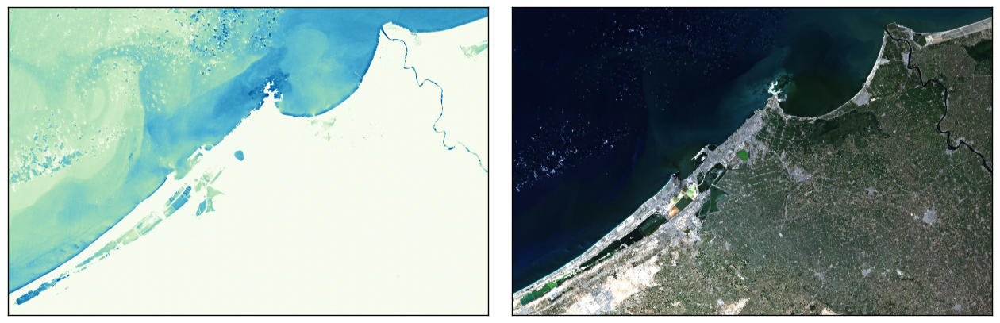

In [21]:
fig, (ax1, ax2) = custom_subplots(nrows=1, ncols=2)

mask = (ndwi!=0)[:, :, 0].astype(np.float32)
ax1.imshow(ndwi, cmap="GnBu", vmin=0.0, vmax=1.0, alpha=mask)
ax2.imshow(render_s2_as_rgb(rgb))

plt.show()
fig.clf()

del mask

**Observe**: There are artifacts around the removed cloud in the ocean. What effect will this have on our model? Should we make efforts towards it and if so, what would you recommend?

## Inspect SAR data

Let's inspect the SAR data from Sentinel-1. There are multiple ways to visualise SAR imagery. The most simple and straightforward is to simply plot the VV-component or VH-component. To capture more information encoded in the 2 SAR bands, one can also plot the SAR image as an RGB image, in this case the 3 channels are (VV, VH, VV/VH)

*Check out `render_s1_as_rgb` in the utility functions to see how this is done.*

In [22]:
# Takes approximately 30s to load
s1_arr = beo.raster_to_array(path_s1, filled=True, fill_value=0.0, cast=np.float32)
s1_rgb = render_s1_as_rgb(s1_arr)

# Let's load the SAR data and normalise it while we are at it.
s1_arr, _statdict = beo.scaler_truncate(s1_arr, -35.0, 5)

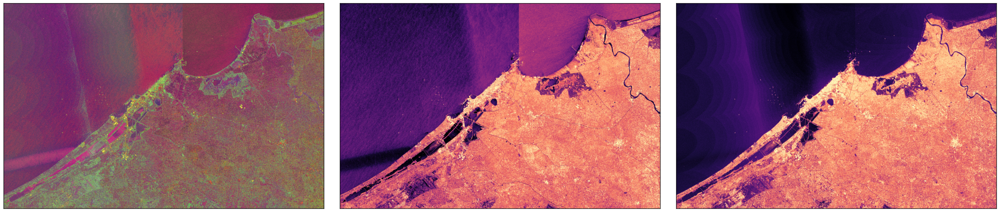

In [23]:
fig, (ax1, ax2, ax3) = custom_subplots(ncols=3, nrows=1, size=(36, 12))
ax1.imshow(s1_rgb)

vv_norm = clip_to_quantiles(s1_arr[:, :, 0])
vh_norm = clip_to_quantiles(s1_arr[:, :, 1])
ax2.imshow(vv_norm, vmin=np.amin(vv_norm), vmax=np.amax(vv_norm), cmap="magma")
ax3.imshow(vh_norm, vmin=np.amin(vh_norm), vmax=np.amax(vh_norm), cmap="magma")

plt.show()
fig.clf()

del vv_norm, vh_norm, s1_rgb

## Prepare data and make train/val split

In [24]:
# Let's generate some patches for a DL model.
patches_s1 = beo.array_to_patches(s1_arr, PATCH_SIZE, n_offsets=OFFSETS)
patches_ndwi = beo.array_to_patches(ndwi, PATCH_SIZE, n_offsets=OFFSETS)

x_train, x_val, y_train, y_val, = beo.split_train_val(patches_s1, patches_ndwi, val_size=0.1)

del s1_arr, ndwi, patches_s1, patches_ndwi

If you want to treat the problem as a binary classification set a threshold here. If you choose to do so, consider the implication of setting different threshold values. Example implementation:

```python
THRESHOLD = 0.01
y_train = (y_train > THRESHOLD).astype(np.float32)
y_val = (y_val > THRESHOLD).astype(np.float32)
```

*Don't worry if that does not make sense yet, it will later!*


Let's load the data into PyTorch. We use the beo dataset loaders, which allows us to add augmentations to the data. Here we use three augmentations:
1. rotation_xy (x_train and y_train)
2. mirror_xy (x_train and y_train)
3. cutmix (cutting and mixing images and labels)

Are there other augmentations that could be relevant to apply as well? What are the pros and cons of applying augmentations?

In [25]:
from torch.utils.data import DataLoader

# Ready the data for pytorch
def callback(x, y):
    return (
        torch.from_numpy(x).float(),
        torch.from_numpy(y).float(),
    )

# Create the dataset and DataLoader
dataset = beo.AugmentationDataset(
    x_train,
    y_train,
    callback=callback, # To turn the augmented numpy arrays into tensors
    input_is_channel_last=True,
    output_is_channel_last=False,
    augmentations=[
        { "name": "rotation_xy", "chance": 0.2 },
        { "name": "mirror_xy", "chance": 0.2 },
        { "name": "cutmix", "chance": 0.2 }
    ],
)
dataset_val = beo.Dataset(
    x_val,
    y_val,
    callback=callback, # To turn the augmented numpy arrays into tensors
    input_is_channel_last=True,
    output_is_channel_last=False,
)

dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
dataloader_val = DataLoader(dataset_val, batch_size=BATCH_SIZE, shuffle=False)

## Train Model

We will use the same simple model as before. Instead of 9 spectral bands from Sentinel-2, this time the model will take as input only 2 SAR bands. The output of the model is the Normalized Difference Water Index (NDWI).

In [26]:
import torch.nn as nn

class SimpleConvNet(nn.Module):
    def __init__(self, in_channels, clamp_output=None):
        super(SimpleConvNet, self).__init__()
        self.clamp_output = True if clamp_output is not None else False

        if self.clamp_output:
            self.output_min = clamp_output[0]
            self.output_max = clamp_output[1]

        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(128)
        )

        self.decoder = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 1, kernel_size=3, padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)

        if self.clamp_output:
            x = torch.clamp(x, self.output_min, self.output_max)

        return x

In [27]:
import torch.optim as optim

# Create the model using the same simple ConvNet as before.
input_channels = 2 # Sentinel 1: VV, VH

# This time we know the output should be in [0.0, 1.0].
model = SimpleConvNet(input_channels, clamp_output=(0.0, 1.0))

# Our loss function. Currently MSE — if you reframe this as a binary problem,
# remember to change it (see the exercise below).
criterion = torch.nn.MSELoss()

optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

# Move model to GPU if available.
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

# Mixed precision (float16) speeds up training on a GPU.
# On a CPU-only runtime we disable it and simply train in float32.
use_amp = device.type == "cuda"
scaler = torch.amp.GradScaler(device.type, enabled=use_amp)


This model uses Mean Squared Error loss. Can you think of other loss functions or maybe combination of loss functions that could produce more interesting results?

**Hint**: *What if we are mostly interested in the presence/non-presence of water and not so much the NDWI value itself? Try and write an implementation of a combined loss function.*

In [28]:
# Let's train a new model!
from tqdm import tqdm

# Customize the progress bar with a fixed width.
bar_format = '{l_bar}{bar:20}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}] {postfix}'

# We record the mean loss per epoch so we can plot learning curves afterwards.
train_losses = []
val_losses = []

# Measure what training this model costs in energy and CO2.
track_start("Model training")

for epoch in range(EPOCHS):
    # --- Training ---
    model.train()
    running_loss = 0.0

    train_pbar = tqdm(dataloader, total=len(dataloader), ncols=140, position=0, leave=True, bar_format=bar_format)
    train_pbar.set_description(f"Epoch: {epoch+1:03d}/{EPOCHS:03d}")

    for i, (inputs, targets) in enumerate(train_pbar):
        # Move inputs and targets to the device (GPU if available).
        inputs, targets = inputs.to(device), targets.to(device)

        # Zero the gradients.
        optimizer.zero_grad()

        # On the GPU, run the forward pass in float16 (mixed precision).
        with torch.autocast(device_type=device.type, dtype=torch.float16, enabled=use_amp):
            # Forward pass
            outputs = model(inputs)

            # Compute loss
            loss = criterion(outputs, targets)

        # With float16, gradients can underflow to zero or overflow — the gradient
        # scaler guards against that. In float32 this would not be needed.
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # Print statistics
        running_loss += loss.item()
        train_pbar.set_postfix({"loss": f"{running_loss / (i + 1):.6f}"})

    train_losses.append(running_loss / len(dataloader))

    # --- Validation (no gradients, no augmentations) ---
    model.eval()
    running_val_loss = 0.0
    with torch.no_grad():
        for val_inputs, val_targets in dataloader_val:
            val_inputs, val_targets = val_inputs.to(device), val_targets.to(device)
            val_outputs = model(val_inputs)
            running_val_loss += criterion(val_outputs, val_targets).item()

    val_losses.append(running_val_loss / len(dataloader_val))
    print(f"Epoch {epoch+1:03d}: train_loss={train_losses[-1]:.6f}  val_loss={val_losses[-1]:.6f}")

# You could save the model like this:
# torch.save(model.state_dict(), os.path.join(FOLDER_PRED, "example_model_water_01.pt"))

model.eval()
if device.type == "cuda":
    torch.cuda.empty_cache()

track_stop("Model training")


Epoch: 001/005: 100%|████████████████████| 5205/5205 [00:50<00:00, 102.31it/s] , loss=0.011530


Epoch 001: train_loss=0.011530  val_loss=0.008468


Epoch: 002/005: 100%|████████████████████| 5205/5205 [00:41<00:00, 126.62it/s] , loss=0.009236


Epoch 002: train_loss=0.009236  val_loss=0.008435


Epoch: 003/005: 100%|████████████████████| 5205/5205 [00:40<00:00, 127.58it/s] , loss=0.008916


Epoch 003: train_loss=0.008916  val_loss=0.009275


Epoch: 004/005: 100%|████████████████████| 5205/5205 [00:40<00:00, 127.38it/s] , loss=0.008697


Epoch 004: train_loss=0.008697  val_loss=0.008497


Epoch: 005/005: 100%|████████████████████| 5205/5205 [00:40<00:00, 127.15it/s] , loss=0.008568


Epoch 005: train_loss=0.008568  val_loss=0.008178
Model training: 223.8 s, 4.91 Wh, 1.32 g CO2eq


EmissionsData(timestamp='2026-09-08T01:26:17', project_name='ccai-flood-part2-water', run_id='170a6059-d9c3-4568-bfba-63ce828773de', experiment_id='5b0fa12a-3dd7-45bb-9766-cc326314d9f1', duration=223.8189332630002, emissions=0.0013152258608284929, emissions_rate=5.876295165539147e-06, cpu_power=1.3632532837402624, gpu_power=10.738240282020346, ram_power=10.0, cpu_energy=0.00023409251801507022, gpu_energy=0.004058684635834, ram_energy=0.0006217136609138886, energy_consumed=0.00491449081476296, water_consumed=0.0, country_name='The Netherlands', country_iso_code='NLD', region='groningen', cloud_provider='', cloud_region='', os='Linux-6.6.122+-x86_64-with-glibc2.35', python_version='3.13.15', codecarbon_version='3.2.9', cpu_count=2, cpu_model='Intel(R) Xeon(R) CPU @ 2.00GHz', gpu_count=1, gpu_model='1 x Tesla T4', longitude=6.5664, latitude=53.2222, ram_total_size=12.671417236328125, tracking_mode='machine', cpu_utilization_percent=3.587443946188341, gpu_utilization_percent=46.30941704035

## Loss curves

A single number at the end of training tells you little — plotting the training and validation loss per epoch is the quickest way to see *how* the model learned. If the validation loss keeps falling in step with the training loss, the model is still learning generalisable structure. If the training loss keeps falling while the validation loss stalls or rises, the model has started to overfit (memorising the training patches instead of learning transferable features).


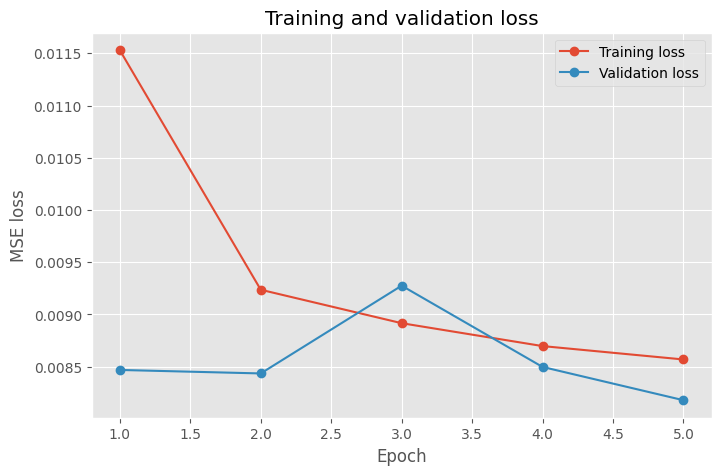

In [29]:
fig, ax = plt.subplots(figsize=(8, 5))
epochs_range = range(1, len(train_losses) + 1)
ax.plot(epochs_range, train_losses, marker="o", label="Training loss")
ax.plot(epochs_range, val_losses, marker="o", label="Validation loss")
ax.set_xlabel("Epoch")
ax.set_ylabel("MSE loss")
ax.set_title("Training and validation loss")
ax.legend()
plt.show()


Currently we are only using the validation loss to visually inspect if our model is overfitting or underfitting. Can we automate this process? Ideas could also include ways for interactively adjusting the learning rate, batchsize, or stopping when it starts to overfit? Depending on the augmentation chosen, the model might underfit (Augmentation helps the model to generalise, but makes it more difficult to fit the training data). How could we more efficiently use the data augmentation steps?

## How good is the water map? (IoU, F1, precision, recall)

The MSE loss tells us how well the model reproduces NDWI *values*, but for flood mapping we ultimately care about a different question: **does the model find the water?** To answer it, we threshold both the predictions and the NDWI labels into binary water masks and compare them with classification metrics:

* **Precision** — of the pixels we flagged as water, how many really are water? Low precision = false alarms.
* **Recall** — of the actual water pixels, how many did we find? Low recall = missed water.
* **F1** — the harmonic mean of precision and recall.
* **IoU (Intersection over Union)** — the overlap between predicted and true water; the standard metric for segmentation tasks.

The trade-off between precision and recall is not just academic. In an early-warning setting, false alarms (low precision) erode trust and waste resources, while missed floods (low recall) mean warnings that never reach people in the water's path. Which error is worse depends on how the map is used — and that is a decision for the people running the response, not for the model.


In [30]:
# Evaluate binary water detection on the validation set.
THRESHOLD = 0.01  # NDWI above this counts as water. Try changing it!

tp = fp = fn = tn = 0

model.eval()
with torch.no_grad():
    for val_inputs, val_targets in dataloader_val:
        preds = model(val_inputs.to(device)).cpu()

        pred_water = preds > THRESHOLD
        true_water = val_targets > THRESHOLD

        tp += (pred_water & true_water).sum().item()
        fp += (pred_water & ~true_water).sum().item()
        fn += (~pred_water & true_water).sum().item()
        tn += (~pred_water & ~true_water).sum().item()

precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0.0
iou = tp / (tp + fp + fn) if (tp + fp + fn) > 0 else 0.0

print(f"Validation water detection at NDWI threshold {THRESHOLD}:")
print(f"  Precision: {precision:.3f}")
print(f"  Recall:    {recall:.3f}")
print(f"  F1:        {f1:.3f}")
print(f"  IoU:       {iou:.3f}")

# Note: these metrics compare the model against *NDWI*, not against real,
# field-verified water. They measure how well the model reproduces its proxy
# label — an upper bound on how well it maps actual water.


Validation water detection at NDWI threshold 0.01:
  Precision: 0.968
  Recall:    0.990
  F1:        0.979
  IoU:       0.958


## Model card

Following *Model Cards for Model Reporting* (Mitchell et al., 2019 — see [References](#references)), here is a summary of the model you just trained. If you ever hand a trained model (or the maps it produces) to someone else, ship a card like this with it.

| | |
|---|---|
| **Model** | `SimpleConvNet` — 4 convolutional layers (~150k parameters), no downsampling, output clamped to [0, 1] |
| **Task** | Per-pixel regression of NDWI (a surface-water proxy) from Sentinel-1 SAR (VV, VH) |
| **Training data** | One Sentinel-1 scene over Alexandria, Egypt; 32×32 px patches; labels are NDWI computed from a Sentinel-2 scene acquired at a different time |
| **Training setup** | See the constants cell: epochs, batch size, learning rate, seed — MSE loss, Adam optimizer, mixed precision on GPU |
| **Evaluation** | MSE + IoU/F1/precision/recall against thresholded NDWI, on a 10% random patch split of the *same scene* |
| **Intended use** | Education; qualitative water-extent mapping over this scene |
| **Out of scope** | Operational flood response; other regions, seasons, or sensors without retraining and validation; any automated decision-making about warnings or resource allocation |
| **Compute footprint** | Measured with CodeCarbon — see [The Carbon Cost of This Notebook](#carbon-cost). The exact figures depend on your runtime and on the electricity grid it runs on |
| **Known failure modes** | Cloud-artifact contamination in the labels; temporal S1/S2 mismatch; tile-edge inconsistencies; surfaces that look water-like to SAR (smooth wet sand, radar shadow) mapped as water; no calibrated uncertainty |

Note the evaluation row carefully: the validation split is drawn randomly from the **same scene** as the training data, so spatially correlated neighbouring patches appear on both sides of the split. The reported metrics are therefore optimistic



<a name="results-and-discussion"></a>
# Results & Discussion


As we did in part I, let's predict all of the Alexandria area and investigate the results. Again the results can be downloaded and be inspected in QGIS. Consider the impact of having both these datasets available for geospatial analysis.

**Mean, Median, Mad, Olympian?**
Predictions of tiles from computer vision models are usually not consistent. Meaning that predicting a building that is in the center of a tile will usually be predicted with higher confidence than a pixel at the very edge of a tile. This is an issue, when every target pixel is of equal importance. To get around this we overlap the tiles and weigh border pixels differently. These predictions can be merged in multiple ways. Some popular ones are:

1. Weighted Mean: Weigh the pixels by distance to the edges and take the weighted average.
2. Olympian: Take the highest and lowest predictions away and calculate the weighted mean of the rest.
3. Weighted Median: Take the weighted median of the overlapping pixels weighted by distance to the edge. This is done by weighing the x-axis and doing a linear 2D interception of the central point. Usually the best compromise of speed and accuracy.
4. MAD matching. This is similar to median merging but more involved. You take the weighted median. Calculate the standard deviation around the median and then take the weighted median of the pixels within a window defined by a z-score. This is the best method - but is computationally intensive. In the last example we are going to use this method.

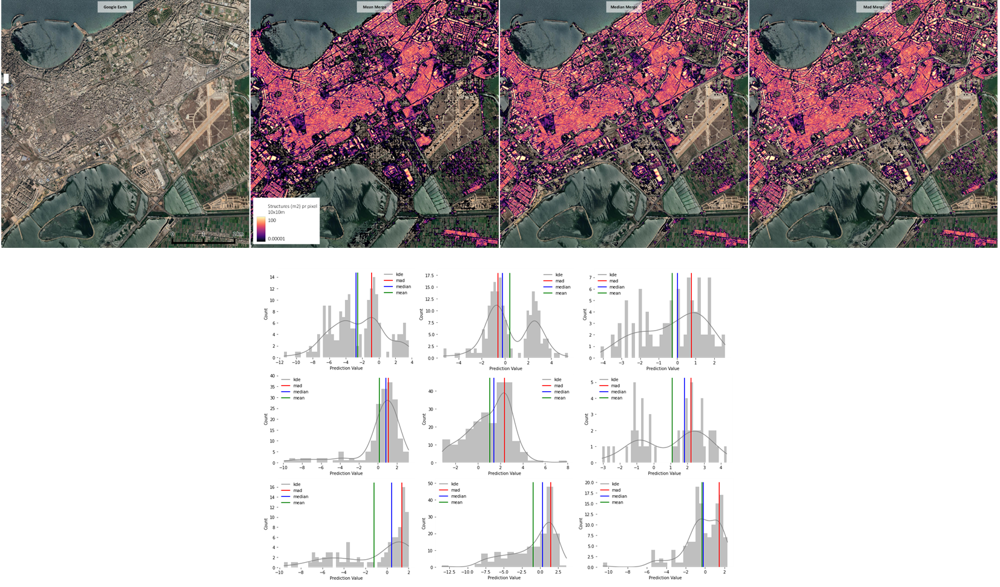

## Inspect predictions on all of Alexandria

Let's predict the whole scene and compare the results.

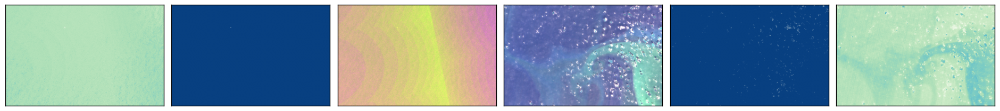

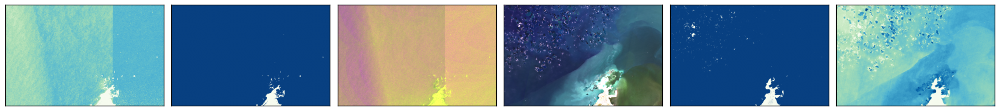

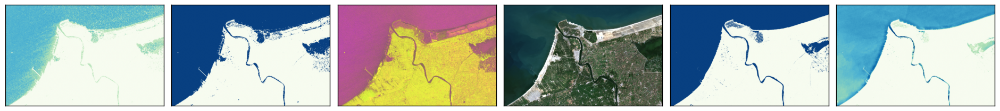

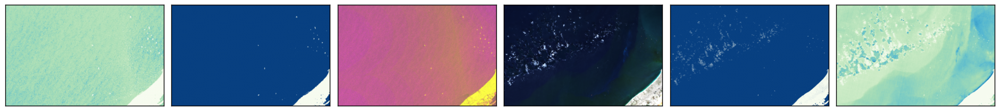

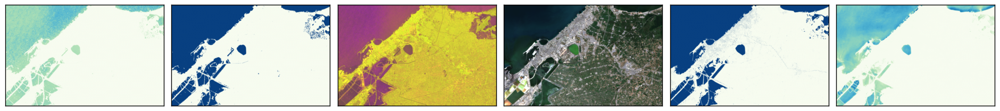

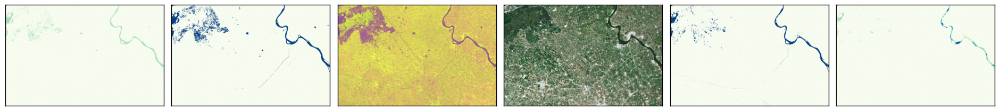

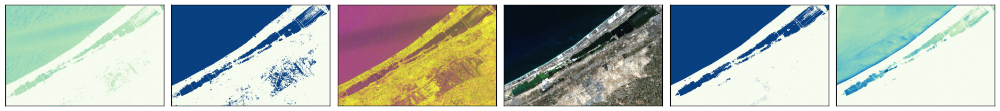

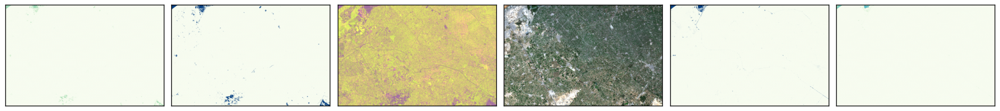

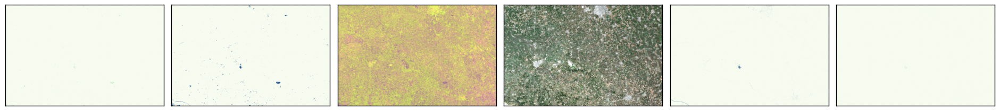

Whole-scene inference: 452.0 s, 6.43 Wh, 1.72 g CO2eq


EmissionsData(timestamp='2026-09-08T01:58:44', project_name='ccai-flood-part2-water', run_id='170a6059-d9c3-4568-bfba-63ce828773de', experiment_id='5b0fa12a-3dd7-45bb-9766-cc326314d9f1', duration=451.9674948769998, emissions=0.0017206153095130237, emissions_rate=3.8069448985870526e-06, cpu_power=1.3766101596676394, gpu_power=10.837709126170173, ram_power=10.0, cpu_energy=0.0006037981810912189, gpu_energy=0.004570018933790002, ram_energy=0.001255457419772222, energy_consumed=0.006429274534653442, water_consumed=0.0, country_name='The Netherlands', country_iso_code='NLD', region='groningen', cloud_provider='', cloud_region='', os='Linux-6.6.122+-x86_64-with-glibc2.35', python_version='3.13.15', codecarbon_version='3.2.9', cpu_count=2, cpu_model='Intel(R) Xeon(R) CPU @ 2.00GHz', gpu_count=1, gpu_model='1 x Tesla T4', longitude=6.5664, latitude=53.2222, ram_total_size=12.671417236328125, tracking_mode='machine', cpu_utilization_percent=2.6607538802660753, gpu_utilization_percent=11.9379157

In [31]:
# Let's predict the whole scene and compare the results.

# We read the whole Alexandria scene in 9 chunks. We use the offset of the chunks to also
# sample the S2 data to calculate NDWI, and the RGB visualisation.
predicted_files = []
chunk_id = 0

# Inference is run once here, but in an operational system it would run for every
# new acquisition, over and over. Let's measure what one scene costs.
track_start("Whole-scene inference")

for s1_arr, offset in beo.raster_to_array_chunks(path_s1, 9, filled=True, fill_value=0.0):

    # Read the data
    s1_arr, _statdict = beo.scaler_truncate(s1_arr, -35.0, 5)

    # Predict the data
    predicted_ndwi = beo.predict_array(
        s1_arr,
        predict_numpy_arr, # <-- defined in the utility functions.
        tile_size=PATCH_SIZE,
        n_offsets=3,
        merge_method="mad",
    )

    # Save the prediction (can be inspected in QGIS and other GIS software).
    out_path = beo.array_to_raster(
        predicted_ndwi,
        reference=path_s1,
        out_path=os.path.join(FOLDER_PRED, f"prediction_{chunk_id}.tif"),
        pixel_offsets=offset,
    )
    chunk_id += 1
    predicted_files.append(out_path)

    # Visualise the results
    rgb = beo.raster_to_array(path_s2, bands=[3, 2, 1], pixel_offsets=offset, filled=True, fill_value=0.0)
    green = beo.raster_to_array(path_s2, bands=[2], pixel_offsets=offset, filled=True, fill_value=0.0, cast=np.float32)
    nir = beo.raster_to_array(path_s2, bands=[6], pixel_offsets=offset, filled=True, fill_value=0.0, cast=np.float32)
    ndwi = compute_ndwi(green, nir) # <-- the same guarded helper as before.

    # Let's mask anything above zero, as we are only interested in water.
    mask_ndwi = (predicted_ndwi > 0.0)[:, :, 0].astype(np.float32)
    mask = (ndwi != 0)[:, :, 0].astype(np.float32)

    # Let's create an example of what a binary model's output might look like:
    THRESHOLD = 0.01 # At least 0.01 NDWI before being considered surface water.
    binary_pred = (predicted_ndwi > THRESHOLD)[:, :, 0].astype(np.float32)
    binary_true = (ndwi > THRESHOLD)[:, :, 0].astype(np.float32)

    # Ready the figure
    fig, (ax1, ax2, ax3, ax4, ax5, ax6) = custom_subplots(nrows=1, ncols=6, size=(24, 48))
    ax1.imshow(predicted_ndwi, vmin=0.0, vmax=1, cmap="GnBu", alpha=mask_ndwi)
    ax2.imshow(binary_pred, vmin=0.0, vmax=1, cmap="GnBu")
    ax3.imshow(render_s1_as_rgb(s1_arr))
    ax4.imshow(render_s2_as_rgb(rgb))
    ax5.imshow(binary_true, vmin=0.0, vmax=1, cmap="GnBu")
    ax6.imshow(ndwi, vmin=0.0, vmax=1.0, cmap="GnBu", alpha=mask)

    plt.show()
    fig.clf()

    # From left to right:
    # Raw predictions, Binary predictions, RGB Sentinel-1 render, RGB Sentinel-2 render, Binary NDWI, Raw NDWI

track_stop("Whole-scene inference")


## Explore the threshold interactively

The binary maps above used a fixed threshold of 0.01. In practice, choosing this threshold *is* choosing the map: a low threshold flags more area as flooded (more false alarms), a high one flags less (more missed water). Use the slider below to see how the mapped water area of the last predicted chunk changes with the threshold — and note how much the "flooded area" figure that a decision-maker would see depends on a single number chosen by the modeller.


In [33]:
# The variables predicted_ndwi and ndwi still hold the last chunk from the loop above.
PIXEL_AREA_KM2 = (10 * 10) / 1e6  # Sentinel pixels are 10 m x 10 m.

def show_threshold(threshold=0.01):
    pred_mask = (predicted_ndwi > threshold)[:, :, 0]
    true_mask = (ndwi > threshold)[:, :, 0]

    fig, (ax1, ax2) = custom_subplots(nrows=1, ncols=2, size=(16, 8))
    ax1.imshow(pred_mask.astype(np.float32), vmin=0, vmax=1, cmap="GnBu")
    ax2.imshow(true_mask.astype(np.float32), vmin=0, vmax=1, cmap="GnBu")
    ax1.set_title(f"Predicted water (threshold={threshold:.3f})")
    ax2.set_title("NDWI water (same threshold)")
    plt.show()

    print(f"Predicted water area: {pred_mask.sum() * PIXEL_AREA_KM2:8.1f} km²")
    print(f"NDWI water area:      {true_mask.sum() * PIXEL_AREA_KM2:8.1f} km²")

try:
    from ipywidgets import interact, FloatSlider
    interact(show_threshold, threshold=FloatSlider(value=0.01, min=0.0, max=0.5, step=0.01))
except ImportError:
    # No widget support in this environment — show a few fixed thresholds instead.
    for t in [0.005, 0.01, 0.05, 0.2]:
        show_threshold(t)


interactive(children=(FloatSlider(value=0.01, description='threshold', max=0.5, step=0.01), Output()), _dom_cl…

In [34]:
# Downloading a file to inspect in QGIS or other GIS software.
from google.colab import files

files.download(predicted_files[2]) # Where the Nile flows into the mediterranean.

# To clean these predictions further you could use a median filter (beo.filter_median)
# or morphological filters like open (beo.morph_open).

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<a name="carbon-cost"></a>
# The Carbon Cost of This Notebook

We measured the two expensive phases — training and whole-scene inference. Let's stop the tracker and see what
they cost. The numbers below are specific to *your* run: the hardware Colab allocated you, the number of epochs
you chose, and the electricity grid the data centre sits on.

In [35]:
# Stop the tracker and summarise what this notebook cost.
CAR_G_CO2_PER_KM = 120.0  # An average new car in Europe emits roughly 120 g CO2 per km.

if globals().get("emissions_tracker") is None:
    print("Carbon tracking is off (or the tracker cell was not run), so there is nothing to report.")
else:
    total_kg = emissions_tracker.stop()
    summary = emissions_tracker.final_emissions_data

    print(f"{'Phase':<26}{'Time (s)':>10}{'Energy (Wh)':>14}{'CO2eq (g)':>12}")
    print("-" * 62)
    for phase_name, measurement in emission_tasks.items():
        print(
            f"{phase_name:<26}{measurement.duration:>10.1f}"
            f"{measurement.energy_consumed * 1000:>14.3f}"
            f"{measurement.emissions * 1000:>12.3f}"
        )
    print("-" * 62)
    print(f"{'Whole notebook':<26}{'':>10}{summary.energy_consumed * 1000:>14.3f}{total_kg * 1000:>12.3f}")

    # The grid you are plugged into matters as much as the code you wrote:
    # the same kWh emits ~8x more CO2 in a coal-heavy grid than in a hydro/nuclear one.
    # kg CO2eq / kWh -> g CO2eq / kWh
    intensity = (total_kg / summary.energy_consumed) * 1000 if summary.energy_consumed > 0 else 0.0

    print()
    print(f"CPU:            {summary.cpu_model} ({int(summary.cpu_count)} cores)")
    print(f"GPU:            {summary.gpu_model or 'none detected'} ({int(summary.gpu_count)})")
    print(f"Grid:           {summary.country_name} ({summary.country_iso_code}) — {intensity:.0f} g CO2eq/kWh")
    print(f"Equivalent to:  {total_kg * 1000 / CAR_G_CO2_PER_KM:.2f} km driven by an average car")
    print(f"Full log:       {os.path.join(FOLDER_PRED, 'emissions.csv')}")

Phase                       Time (s)   Energy (Wh)   CO2eq (g)
--------------------------------------------------------------
Model training                 223.8         4.914       1.315
Whole-scene inference          452.0         6.429       1.721
--------------------------------------------------------------
Whole notebook                              20.961       5.610

CPU:            Intel(R) Xeon(R) CPU @ 2.00GHz (2 cores)
GPU:            1 x Tesla T4 (1)
Grid:           The Netherlands (NLD) — 268 g CO2eq/kWh
Equivalent to:  0.05 km driven by an average car
Full log:       CCAI_FLOODS_TUTORIAL_DATA_PREDICTIONS/emissions.csv


### Reading the number

Two things are usually more surprising than the total itself.

**Inference is not free.** Compare the two rows. Training was a one-off; inference over the scene is what an
operational flood service would repeat for *every* new Sentinel-1 acquisition — several times a week, over
whole continents, for years. In deployed systems the lifetime cost of inference routinely dwarfs the cost of
training. If you scale this notebook to the Mediterranean, or to the globe, that row is the one that grows.

**Where you compute matters as much as how you compute.** The same job run on a grid at 700 g CO₂eq/kWh emits
roughly eight times what it would on one at 90 g. Choosing a low-carbon region for a training job is often a
bigger lever than any optimisation you can make to the code.

### What this measurement does and does not include

CodeCarbon reports an *estimate*, and it is worth being precise about its boundaries:

* It measures the **energy drawn while your code runs** — CPU, GPU, and RAM. Where hardware power sensors are
  not readable (many virtual machines, most cloud CPUs), it falls back to modelled power values based on the
  processor's rated draw, so treat the figures as an order of magnitude, not a meter reading.
* Grid carbon intensity is a **country- or region-level average**, not the real-time mix at the moment you ran.
* It does **not** include the embodied carbon of manufacturing the hardware, the satellites and ground segment
  that produced the data, the storage and transfer of that data, or the cooling overhead of the data centre
  beyond a default PUE assumption.

So the number is a floor, not a full life-cycle assessment. That is still far more useful than reporting nothing.

### The other side of the ledger

None of this argues against doing the work. A few grams of CO₂ to map flood extent — against damage measured in
lives and billions — is an easy trade. But the trade should be *stated*, not assumed, and it stops being obvious
at scale: a foundation model pretrained on global satellite imagery can emit several tonnes. The question to
carry forward is not "is this model too expensive?" but "is this the cheapest model that answers the question,
and did I say what it cost?"

### Exercises

* Re-run training with more epochs, or a larger `PATCH_SIZE`, and compare the energy per phase. Does accuracy
  improve in proportion to the extra energy spent?
* Switch the Colab runtime from GPU to CPU and train again. The GPU draws far more power — but finishes much
  sooner. Which one used less energy overall?
* Open `emissions.csv` in the predictions folder. It has one row per run, with the full breakdown (CPU, GPU, and
  RAM energy separately). Plot energy against epochs across a few runs.
* Write the two lines you would put in a paper's experimental-setup section to report this footprint honestly.
  Compare with how Lacoste et al. (2019) and Luccioni et al. (2023) report theirs (see
  [References](#references)).

<a name="predictions-to-decisions"></a>
# From Predictions to Decisions

So far this has been a machine-learning exercise. But water maps like the one you just made are produced operationally every time a major flood happens — so it is worth being explicit about **how such maps are actually used, and by whom**.

## How the layers combine

No single data layer answers the question "who needs help?". Risk emerges from combining them:

| Layer | Source in this tutorial | Role in risk terms |
|---|---|---|
| Water extent | This notebook (Sentinel-1 → water) | **Hazard** — where the water is |
| Building density | Part I (Sentinel-2 → buildings) | **Exposure** — what is in the water's way |
| Elevation | Copernicus DEM (final exercise) | **Susceptibility** — where water will go |
| Population | e.g. WorldPop, GHSL | **Exposure** — how many people are affected |

Overlaying hazard on exposure gives the products that actually drive decisions: *"this many buildings and people are inside the flooded area"*, *"these neighbourhoods flood first if the water rises"*, *"these roads to the hospital are cut off"*.

## Decision workflows these maps feed

* **Flood risk assessment & preparedness** (before an event): DEM-based flood susceptibility combined with exposure maps identifies high-risk neighbourhoods, informing land-use planning, drainage investment, and evacuation planning.
* **Early warning & anticipatory action** (as an event develops): forecast rainfall plus susceptibility and exposure determine who gets warned and where aid is pre-positioned *before* the flood peaks.
* **Response planning** (during): rapid SAR-based water maps show the actual extent — which areas to evacuate, which access routes remain open, where to site shelters and distribution points.
* **Recovery & resource allocation** (after): flooded-area × building-density estimates support damage assessment, prioritisation of reconstruction funds, and insurance payouts.

## Who the stakeholders are

* **National and local government**: civil-protection agencies, hydro-meteorological services, and municipalities — the ones who issue warnings and order evacuations.
* **International mapping services**: the [Copernicus Emergency Management Service](https://emergency.copernicus.eu/) and [UNOSAT](https://unosat.org/) produce exactly the kind of rapid flood maps this notebook approximates, on request, within hours of a disaster.
* **Humanitarian organisations**: IFRC and Red Cross / Red Crescent societies (including forecast-based financing and anticipatory-action programmes), UN agencies, and NGOs deciding where to send teams and supplies.
* **Financial actors**: the World Bank / GFDRR, development banks, and insurers using flood extents for risk financing and payouts.
* **Affected communities**: the people the maps are ultimately about — and who are usually *not* in the loop when the maps are made. Keep that in mind when you read the next section.


In [36]:
# A first "decision product": total mapped water area across all predicted chunks.
total_water_km2 = 0.0
for f in predicted_files:
    pred = beo.raster_to_array(f, filled=True, fill_value=0.0)
    total_water_km2 += (pred > 0.01).sum() * PIXEL_AREA_KM2

print(f"Total mapped water area across the scene: {total_water_km2:.1f} km²")

# Exercise: combine this with Part I. Load your building-density prediction
# from Part I for the same area and compute the built-up area that falls
# *inside* the water mask. That single number — exposed built-up area — is
# the kind of figure a civil-protection agency actually acts on.
# Who else, from the stakeholder list above, would want it, and in what form?


Total mapped water area across the scene: 4418.0 km²


<a name="limitations-responsible-use"></a>
# Limitations & Responsible Use

The section above shows the promise; this one is about the responsibility. A model-based flood map is **not a neutral or perfect picture of reality** — it is a chain of modelling choices (sensor, index, threshold, architecture, training region), each of which shapes where the map says water is. When such maps influence where warnings, resources, and support are directed, their limitations become people's problems. Before using a map like yours for anything beyond learning, work through the following.

**Uncertainty.** Our labels are NDWI, a proxy — the model learns to reproduce an index, not verified water. The labels contain cloud-mask artifacts (you saw them earlier), the S1 and S2 scenes were captured at different times, tile-edge effects add noise, and the model outputs no calibrated confidence: a pixel value of 0.4 is *not* "40% probability of water". Honest products communicate uncertainty — confidence maps, ranges, masks of known artifacts — instead of presenting one crisp blue polygon as truth.

**Exposure is not vulnerability.** Counting flooded buildings tells you what is *exposed*, not who can cope. Two equally flooded neighbourhoods can need very different help depending on construction quality, income, age, disability, and access to transport. A map that only shows exposure will systematically understate the needs of the most vulnerable.

**Data gaps and representation.** Building and population datasets are least accurate exactly where risk is often highest: informal settlements and rapidly growing peri-urban areas are chronically under-mapped, and global datasets are trained mostly on well-mapped regions. A model trained on Alexandria will not transfer freely to other regions, seasons, or flood types. The communities missing from the data are missing from the map — and therefore at risk of being missing from the response.

**Spatial resolution.** At 10 m per pixel, a map can support neighbourhood-level decisions ("this district is flooded") but not street- or building-level ones ("this house is safe"). Narrow streets, small channels, and water under vegetation or between buildings are simply invisible. Match the decision to the resolution — never the other way around.

**High-stakes use.** Errors are not symmetric: a false alarm wastes resources and erodes trust; a miss can cost lives. When a map influences who gets warned or helped, its errors decide who doesn't. Practical rules of thumb used by operational services:

* Model outputs are **decision support, not decision making** — a human who understands the local context stays in the loop.
* Validate against ground truth (or at least independent data) before operational use, and report metrics honestly — including where they do not apply.
* Ship documentation with every model and dataset (that is what the model card and datasheet above are for).
* Ask who is *not* represented in your data — and what your map will do to them.

**Reflection**: look back at your threshold slider. If your map fed an aid-allocation decision tomorrow, which threshold would you pick, who would you consult, and what would you refuse to let the map decide on its own?


## Reflections and exercises
Now you are able to determine the location of structures from optical imagery (Part I) and map surface water using radar data that penetrates through clouds (Part II). Reflect upon how these tools could be used and improved upon further. It is a powerful combination.

* The model used was the same simple model as in Part I. What are the limitations and how would you improve it?
* Where is the model doing well, where is it doing less well?
* More data is available to run the model than what was used. What other data sources could be interesting?
* We only inspected the results visually on Alexandria, plus patch-level metrics against NDWI. Could you create a proper test set — ideally one that is spatially separate from the training area? Would the metrics change, and why?
* There is a temporal difference between the Sentinel-1 and Sentinel-2 images as both images are registered at a different time. Would this be a problem? Inspect the images side by side to see if the differences are problematic. How could you alleviate some of these problems?
* Rephrase this case to a binary classification problem where you detect if there is water or not. This means adjusting the training data, changing the output of the model, and choosing a new loss function. Can you achieve better results compared to thresholding only after training (like we did above)?
* Look again at the energy figures from [The Carbon Cost of This Notebook](#carbon-cost). Which of the improvements you just proposed (a bigger model, more epochs, more input bands, a larger area) would move that number the most — and how would you justify the extra compute to a reviewer?
* Revisit [Limitations & Responsible Use](#limitations-responsible-use): which of the limitations listed there could you actually reduce with the improvements you proposed, and which are inherent to the data?


# Final exercise (if any time left)

Up till this point we have not yet used the DEM data, even though it is very valuable source of information. Do your own research to figure out how digital elevation models are used in flood research. Try to implement something yourself as well. Simple possibilities include:
- Use the DEM as an input to predict the water bodies, does this help?
- What if some extreme event in Alexandria would lead to a sudden increase of sea level by 1m, 5m or 20m. Use the DEM to figure out which areas would be impacted the most. Are there key locations that could be fortified to minimise the damage?
- ...

<a name="scalable-publishable"></a>
# Doing Scalable and Publishable Work

This tutorial handed you clean data for one small area. Real projects — and publishable research — start where the tutorial stops: you have to build your own dataset, at scale, and defend every choice in it. This section maps the road from here to there.

## 1. Global training data is the hard part

The approach you used here — pairing a Sentinel-1 scene with a near-simultaneous cloud-free Sentinel-2 scene and deriving labels from a water index — has long been standard practice, for a simple reason: SAR imagery is incomprehensible to the human eye, so you cannot hand-label it directly. (Alongside NDWI, the **MNDWI** — which replaces NIR with SWIR — is widely used and separates water from built-up surfaces better.)

The step from *this scene* to a *global model* is a global set of such pairs, and building that dataset is the hard part of the work. **DeepSARFlood** ([Sharma et al., 2025](https://linkinghub.elsevier.com/retrieve/pii/S2666017225000094)) automates exactly this: give it a point with a possibility of water, and its [automated labelling notebook](https://github.com/hydrosenselab/DeepSARFlood/blob/master/automated_labels.ipynb) uses Google Earth Engine to find all paired Sentinel-1/Sentinel-2 acquisitions for that site. Point it at flood events around the world and you have the raw material of a training set that generalises beyond one delta.

Before building your own dataset, know the established benchmarks — **Sen1Floods11** (Bonafilia et al., 2020) and **WorldFloods** (Mateo-García et al., 2021) are the standard starting points — because evaluating against shared benchmarks is what makes results comparable, and publishable.

## 2. Clouds: the label problem you didn't have

Your Sentinel-2 scene was conveniently cloud-free. At scale it never is — and a water index under a cloud is meaningless: you cannot tell what is underneath, so those "labels" are noise. If you train on them anyway, the model learns the noise.

**Exercise (hint: the loss function).** You do not have to discard a whole scene because 20% of it is cloudy. Compute a cloud mask (for example from the Sentinel-2 scene-classification / QA band) and make the loss *masked*: compute the per-pixel loss as usual, multiply it by the valid-pixel mask, and normalise by the number of valid pixels. Cloudy pixels then contribute nothing to the gradient — the model simply never learns from them. Try implementing `masked_mse(pred, target, valid_mask)` and dropping it into the training loop above.

## 3. Model choice: transformers vs. big CNNs

The field has moved on from plain CNNs: Vision Transformers (ViT) and hierarchical variants such as the Swin Transformer now dominate many vision benchmarks, and DeepSARFlood itself uses transformer-based deep ensembles. But large CNNs — ResNet backbones, U-Nets — remain very strong on dense prediction tasks, particularly at the modest dataset sizes typical of flood mapping, and they train with far less data and compute. A fair comparison (same data, same augmentations, same compute budget) between a U-Net/ResNet baseline and a ViT/Swin model is a worthwhile experiment in itself — and reviewers will expect the CNN baseline regardless. Pretrained geospatial foundation models (for example Prithvi-EO) are a third option worth benchmarking: fine-tuning them can beat training from scratch when your labelled data is limited.

The literature has seminal papers on both sides — some contribute *data* (Sen1Floods11, WorldFloods), some contribute *models and methods* (transformer-based flood mapping, deep ensembles for uncertainty). Read both kinds: dataset papers teach you what makes labels trustworthy; model papers teach you what actually moves the metrics.

## 4. Integrating buildings and socioeconomic data

A water map alone is not a risk product — integration with buildings and socioeconomic data is a must (this is the point of [From Predictions to Decisions](#predictions-to-decisions)). One dataset deserving special mention: **LoD1 building models from TUM**, which provide not just footprints but *building heights* globally, giving both density and vertical structure.

Height matters from an **equity perspective**: in a deep flood, a person in a single-storey house has no way to escape vertically, while a person in multi-storey housing can move upstairs and wait for rescue. Two neighbourhoods with identical flood depth and identical building density can therefore face completely different mortality risk — and a map that ignores building height will not see the difference. Combining flood depth (water extent + DEM) with building height turns a hazard map into a *who-can-escape* map.

## 5. Research ideas and open problems

Directions you could take this work — each is a realistic student project, and several are open research problems:

1. **Vector-borne disease risk after floods**: stagnant residual water weeks after a flood breeds mosquitoes. Map water *persistence* from the Sentinel-1 time series (not just peak extent), and combine it with population, housing quality, and health-facility data to predict malaria/dengue outbreak hotspots — shifting the map's purpose from rescue to public health.
2. **Equity-aware exposure mapping**: use LoD1 building heights to map the share of single-storey housing per neighbourhood — a vertical-evacuation-capacity layer that identifies who needs warning and shelter *first*, not just who gets wet.
3. **Flood duration and recession mapping**: peak extent tells you who was hit; duration tells you who cannot return home, which crops are destroyed, and where disease risk accumulates. The Sentinel-1 revisit cycle makes this a time-series problem.
4. **Cross-region generalisation**: train on one region or continent, test on others. Where does the model fail — different land cover, different flood types, different SAR geometry — and can domain adaptation close the gap?
5. **Uncertainty quantification**: deep ensembles (as in DeepSARFlood) give per-pixel confidence. How should that uncertainty be *communicated* so that a civil-protection officer can act on it?
6. **Infrastructure disruption**: intersect flood maps with road networks (OpenStreetMap) and critical facilities to map lost accessibility — which hospitals are unreachable, which evacuation routes are cut.
7. **Urban flooding under SAR limitations**: radar layover and shadow make cities — exactly where exposure is highest — the hardest place to detect water. Quantify the blind spot and explore fusion with other sensors to fill it.
8. **Compound coastal flooding**: in deltas like the Nile's, storm surge, rainfall, and river discharge flood together. Combine the DEM, water maps, and forecast data to model compound events rather than single drivers.


<a name="references"></a>
# References

* McFeeters, S.K. (1996). *The use of the Normalized Difference Water Index (NDWI) in the delineation of open water features.* International Journal of Remote Sensing, 17(7), 1425–1432.
* Rolnick, D. et al. (2022). *Tackling Climate Change with Machine Learning.* ACM Computing Surveys, 55(2). https://arxiv.org/abs/1906.05433
* Mitchell, M. et al. (2019). *Model Cards for Model Reporting.* Proceedings of FAT* 2019. https://arxiv.org/abs/1810.03993
* Gebru, T. et al. (2021). *Datasheets for Datasets.* Communications of the ACM, 64(12). https://arxiv.org/abs/1803.09010
* Sentinel-1 mission: https://sentinels.copernicus.eu/web/sentinel/missions/sentinel-1
* Sentinel-2 mission: https://sentinels.copernicus.eu/web/sentinel/missions/sentinel-2
* Copernicus DEM: https://spacedata.copernicus.eu/collections/copernicus-digital-elevation-model
* Copernicus Emergency Management Service (rapid flood mapping): https://emergency.copernicus.eu/
* UNOSAT (United Nations Satellite Centre): https://unosat.org/
* WorldPop population data: https://www.worldpop.org/
* GHSL — Global Human Settlement Layer: https://ghsl.jrc.ec.europa.eu/
* Sharma, N. et al. (2025). *DeepSARFlood: Rapid and automated SAR-based flood inundation mapping.* Science of Remote Sensing. https://linkinghub.elsevier.com/retrieve/pii/S2666017225000094 · Code: https://github.com/hydrosenselab/DeepSARFlood
* Bonafilia, D. et al. (2020). *Sen1Floods11: a georeferenced dataset to train and test deep learning flood algorithms for Sentinel-1.* CVPR Workshops. https://github.com/cloudtostreet/Sen1Floods11
* Mateo-García, G. et al. (2021). *Towards global flood mapping onboard low cost satellites with machine learning* (WorldFloods). Scientific Reports, 11. https://github.com/spaceml-org/ml4floods
* Xu, H. (2006). *Modification of normalised difference water index (NDWI) to enhance open water features in remotely sensed imagery* (MNDWI). International Journal of Remote Sensing, 27(14), 3025–3033.
* TUM global LoD1 building models (building footprints with heights), Technical University of Munich — see the GlobalBuildingAtlas project by the Zhu group.
* Prithvi-EO geospatial foundation models (IBM/NASA): https://huggingface.co/ibm-nasa-geospatial
* Courty, B. et al. (2024). *CodeCarbon: Estimate and Track Carbon Emissions from Machine Learning Computing.* https://github.com/mlco2/codecarbon · Documentation: https://docs.codecarbon.io/
* Lacoste, A. et al. (2019). *Quantifying the Carbon Emissions of Machine Learning.* https://arxiv.org/abs/1910.09700 · ML CO2 Impact calculator: https://mlco2.github.io/impact/
* Strubell, E., Ganesh, A., McCallum, A. (2019). *Energy and Policy Considerations for Deep Learning in NLP.* ACL 2019. https://arxiv.org/abs/1906.02243
* Luccioni, A.S., Viguier, S., Ligozat, A.-L. (2023). *Estimating the Carbon Footprint of BLOOM, a 176B Parameter Language Model.* JMLR 24. https://arxiv.org/abs/2211.02001
* Buteo documentation: https://casperfibaek.github.io/buteo/buteo.html
